In [2]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix

In [3]:
# Load Gambar dari Folder Dataset
dataset_path = r"Laliga teams"
images = []
labels = []

In [4]:
# Resize dan Ubah Gambar Menjadi Array
for team in os.listdir(dataset_path):
    team_path = os.path.join(dataset_path, team)
    if os.path.isdir(team_path):
        for img_file in os.listdir(team_path):
            img_path = os.path.join(team_path, img_file)
            try:
                img = Image.open(img_path)
                img = img.resize((128, 128))  # Resize ke ukuran 128x128
                img_array = np.array(img)
                images.append(img_array)
                labels.append(team)
            except Exception as e:
                print(f"Error loading image {img_path}: {e}")

In [5]:
# Ubah ke NumPy Array
images = np.array(images)
labels = np.array(labels)
print(f"Loaded {len(images)} images.")


Loaded 2000 images.


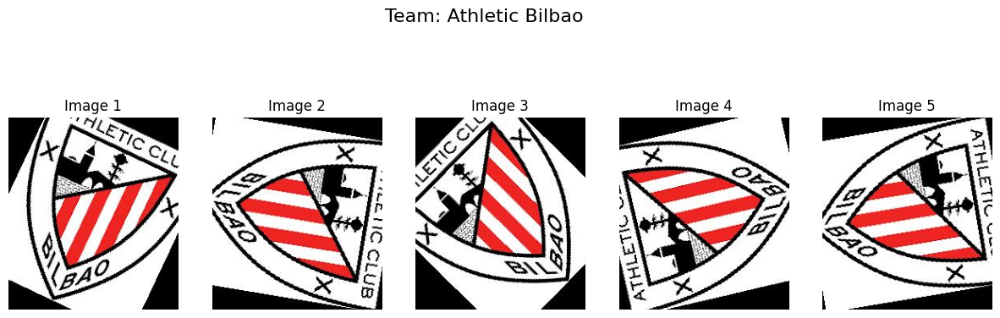

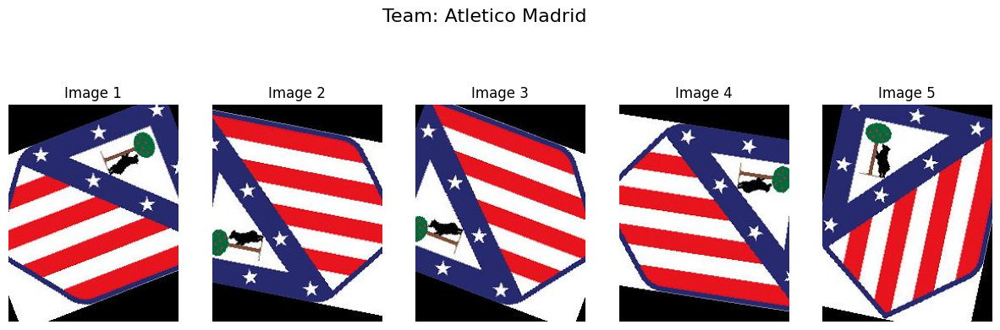

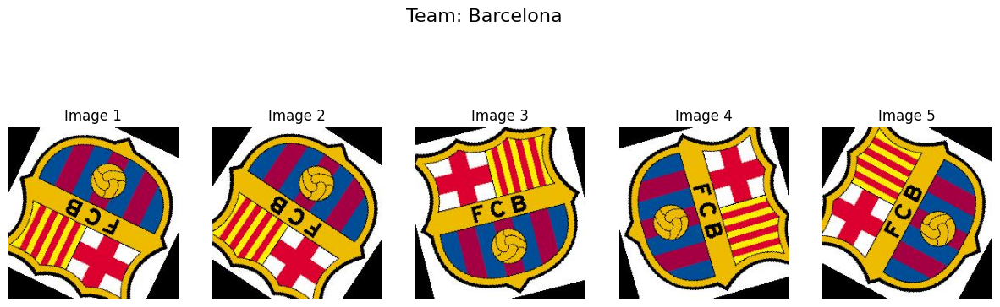

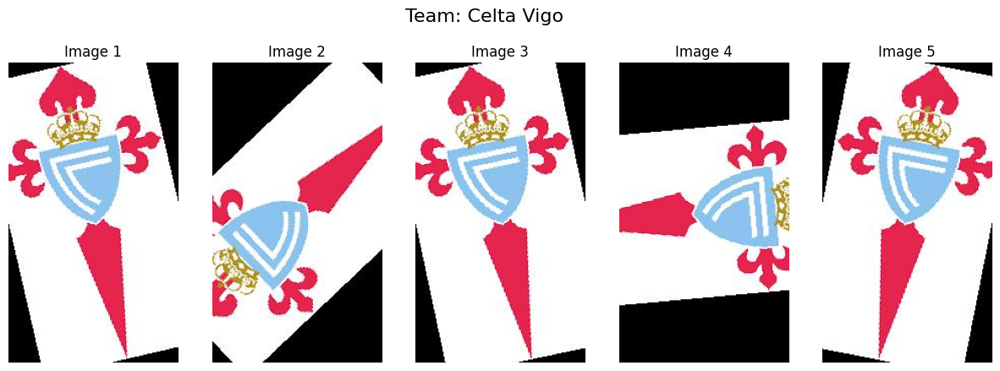

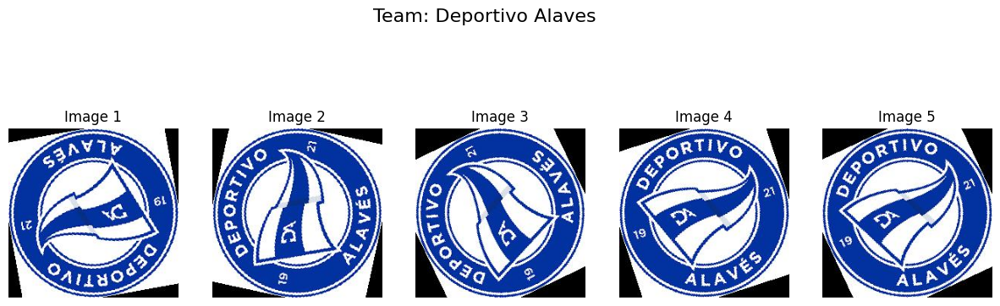

...

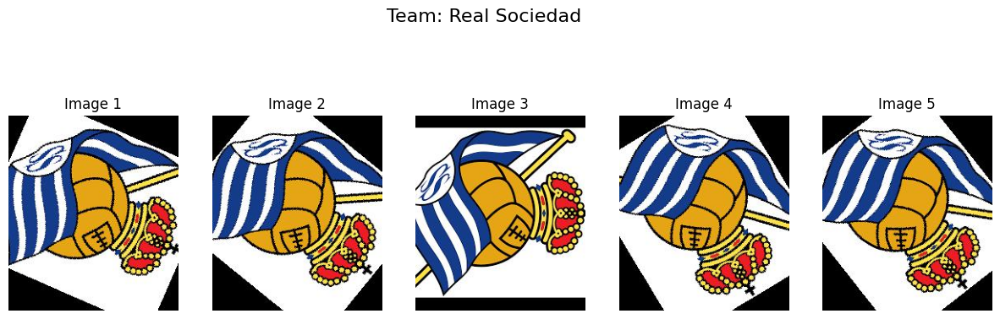

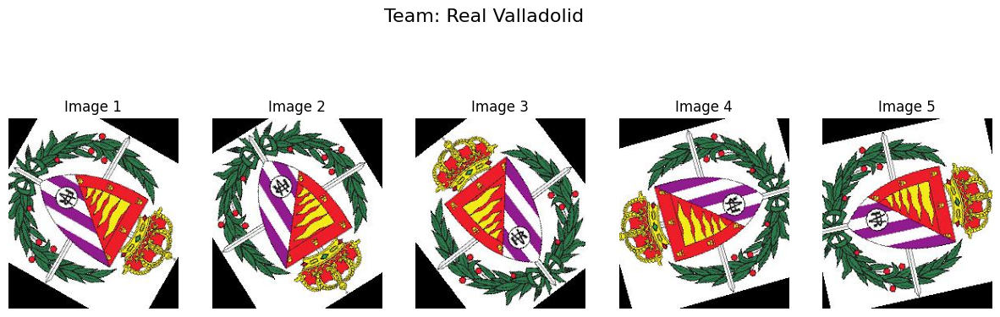

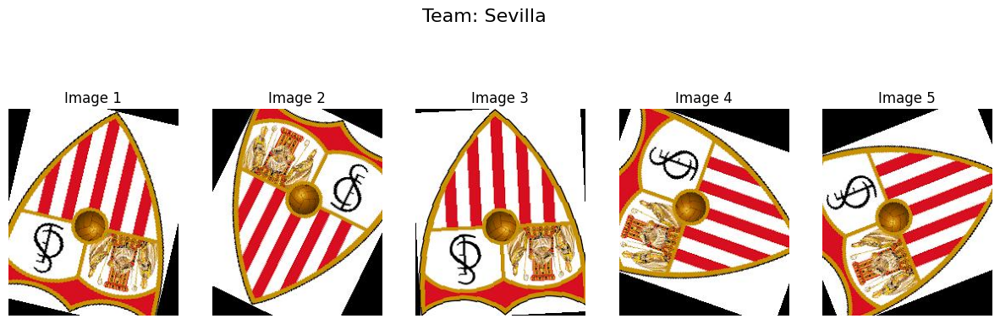

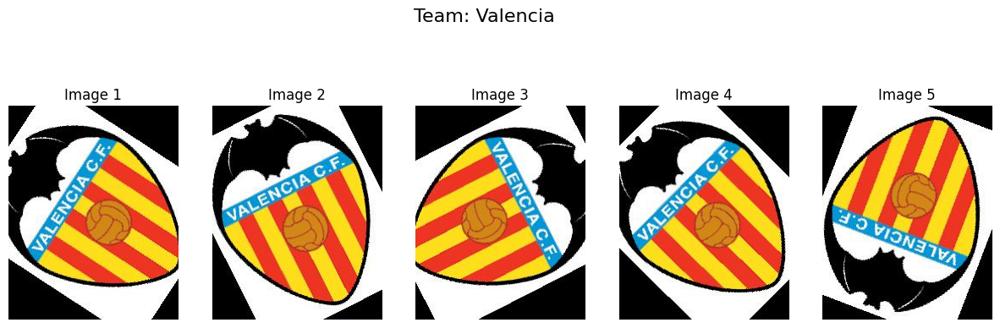

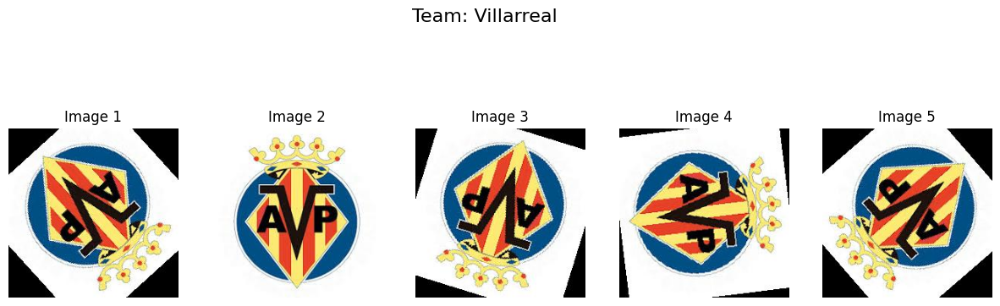

In [6]:
def display_random_images(dataset_path, num_images=5):
    for team in os.listdir(dataset_path):
        team_path = os.path.join(dataset_path, team)
        if os.path.isdir(team_path):
            img_files = os.listdir(team_path)
            random_imgs = random.sample(img_files, min(num_images, len(img_files)))
            fig, axes = plt.subplots(1, len(random_imgs), figsize=(15, 5))
            fig.suptitle(f"Team: {team}", fontsize=16)
            for i, img_file in enumerate(random_imgs):
                img_path = os.path.join(team_path, img_file)
                img = Image.open(img_path)
                axes[i].imshow(img)
                axes[i].axis("off")
                axes[i].set_title(f"Image {i+1}")
            plt.show()

display_random_images(dataset_path)

In [7]:
# Normalisasi Pixel
X = images / 255.0

# One-Hot Encoding Label
label_encoder = LabelEncoder()
y = to_categorical(label_encoder.fit_transform(labels))

# Split Data ke Train, Validation, dan Test
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print(f"Train samples: {len(X_train)}, Validation samples: {len(X_val)}, Test samples: {len(X_test)}")

Train samples: 1400, Validation samples: 300, Test samples: 300


In [8]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(128, 128, 3)),
    MaxPooling2D((2, 2)),

    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),

    Dense(len(label_encoder.classes_), activation='softmax')
])

c:\Users\jange\OneDrive\Dokumen\Kuliah\Smt 6\Prak. ML\.venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [9]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 20)             │         5,140 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,521,172 (24.88 MB)

 Trainable params: 6,521,172 (24.88 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# Inisialisasi Data Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Buat Data Generator
train_generator = train_datagen.flow(X_train, y_train, batch_size=32)
val_generator = ImageDataGenerator().flow(X_val, y_val, batch_size=32)

In [11]:
history = model.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    steps_per_epoch=len(X_train) // 32,
    validation_steps=len(X_val) // 32
)

c:\Users\jange\OneDrive\Dokumen\Kuliah\Smt 6\Prak. ML\.venv\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 34s 618ms/step - accuracy: 0.0902 - loss: 2.9957 - val_accuracy: 0.6076 - val_loss: 1.5534
Epoch 2/30
 1/43 ━━━━━━━━━━━━━━━━━━━━ 18s 452ms/step - accuracy: 0.3750 - loss: 2.0515

c:\Users\jange\OneDrive\Dokumen\Kuliah\Smt 6\Prak. ML\.venv\Lib\site-packages\keras\src\trainers\epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - accuracy: 0.3750 - loss: 2.0515 - val_accuracy: 0.6736 - val_loss: 1.4914
Epoch 3/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 24s 556ms/step - accuracy: 0.4130 - loss: 1.7878 - val_accuracy: 0.8785 - val_loss: 0.4639
Epoch 4/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 55ms/step - accuracy: 0.7812 - loss: 0.7215 - val_accuracy: 0.9062 - val_loss: 0.4238
Epoch 5/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 21s 485ms/step - accuracy: 0.7183 - loss: 0.9002 - val_accuracy: 0.9965 - val_loss: 0.1419
Epoch 6/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step - accuracy: 0.8438 - loss: 0.4897 - val_accuracy: 0.9931 - val_loss: 0.1624
Epoch 7/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 22s 504ms/step - accuracy: 0.8474 - loss: 0.4637 - val_accuracy: 1.0000 - val_loss: 0.0323
Epoch 8/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.9688 - loss: 0.2286 - val_accuracy: 1.0000 - val_loss: 0.0413
Epoch 9/30
43/43 ━━━━━━━━━━━━━━━━━━━━ 22s 504ms/step - accuracy: 0.9115 - loss: 0.2864 - val_accuracy: 0.9931 - val_

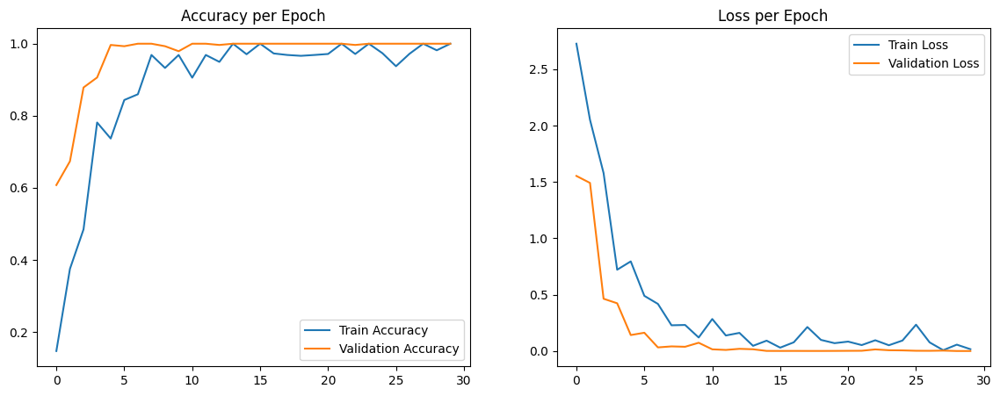

In [12]:
# Visualisasi Akurasi
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy per Epoch')

# Visualisasi Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss per Epoch')

plt.show()

10/10 ━━━━━━━━━━━━━━━━━━━━ 2s 170ms/step - accuracy: 1.0000 - loss: 1.5807e-04
Test Accuracy: 1.0000
10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step


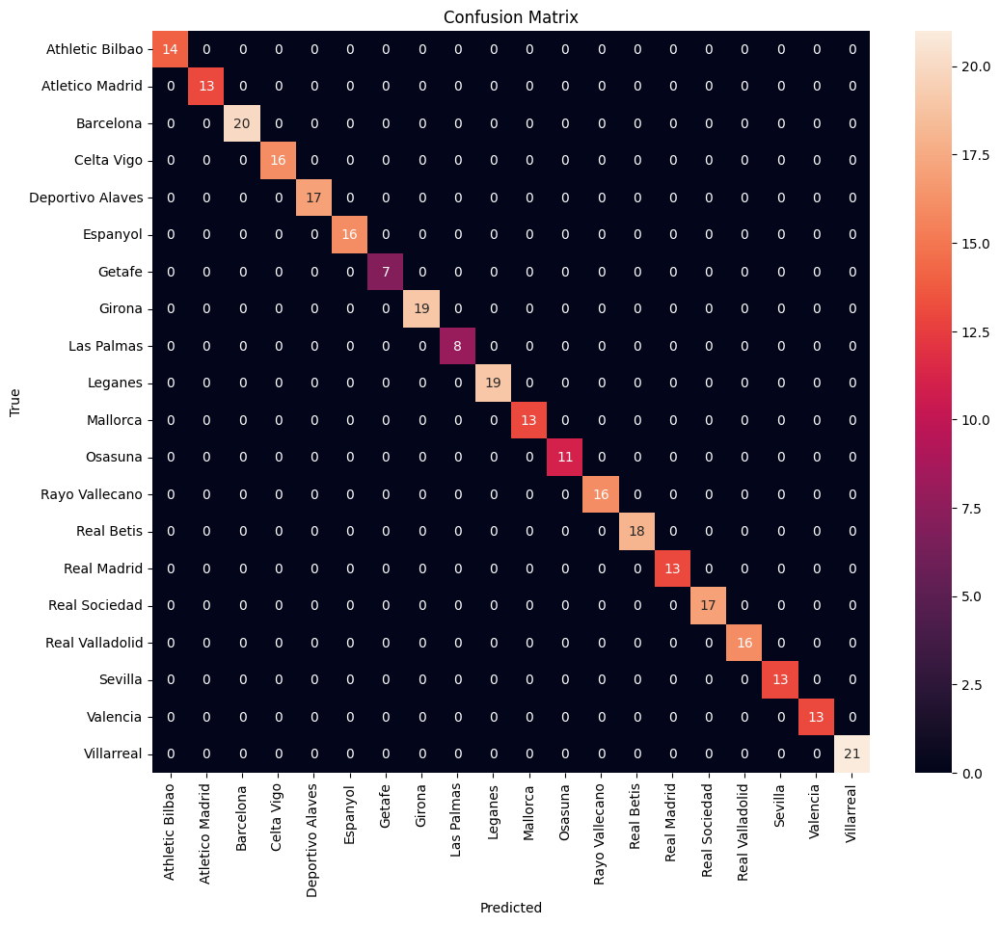

                  precision    recall  f1-score   support

 Athletic Bilbao       1.00      1.00      1.00        14
 Atletico Madrid       1.00      1.00      1.00        13
       Barcelona       1.00      1.00      1.00        20
      Celta Vigo       1.00      1.00      1.00        16
Deportivo Alaves       1.00      1.00      1.00        17
        Espanyol       1.00      1.00      1.00        16
          Getafe       1.00      1.00      1.00         7
          Girona       1.00      1.00      1.00        19
      Las Palmas       1.00      1.00      1.00         8
         Leganes       1.00      1.00      1.00        19
        Mallorca       1.00      1.00      1.00        13
         Osasuna       1.00      1.00      1.00        11
  Rayo Vallecano       1.00      1.00      1.00        16
      Real Betis       1.00      1.00      1.00        18
     Real Madrid       1.00      1.00      1.00        13
   Real Sociedad       1.00      1.00      1.00        17
 Real Vallado

In [13]:
# Evaluasi Akurasi
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {test_acc:.4f}")

# Prediksi dan Confusion Matrix
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Classification Report
print(classification_report(y_true, y_pred_classes, target_names=label_encoder.classes_))

In [14]:
model.save("laliga_logo_cnn_model.h5")

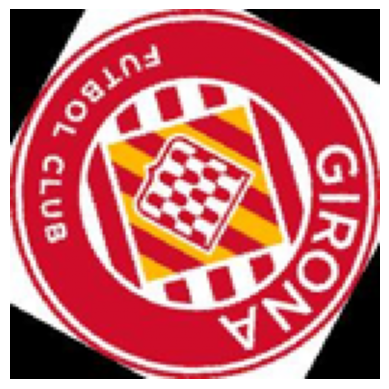

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
Predicted team: Girona


In [15]:
# Load Model
from tensorflow.keras.models import load_model
model_loaded = load_model("laliga_logo_cnn_model.h5")

# Prediksi Satu Gambar
sample_img = X_test[0]
plt.imshow(sample_img)
plt.axis('off')
plt.show()

sample_img_expanded = np.expand_dims(sample_img, axis=0)
predicted_class = np.argmax(model_loaded.predict(sample_img_expanded), axis=1)
print("Predicted team:", label_encoder.classes_[predicted_class[0]])
